In [2]:
import os
import numpy as np
import tifffile as tiff
import matplotlib.pyplot as plt
import cv2
import math
import pandas as pd
from CSL_2025_Python_codes import spim2XYZ, XYZ2Lab, spim2rgb, XYZ2RGB
from functions import *

1. Load Spectral Reflectances Cubes


In [3]:
# Define parameters
# Wether we want to use initial samples (False) or test samples (True)
test = False 

# The test trial (1 or 2)
trial = 1 

# The operator (1 or 2 or 3)
operator = 3

In [4]:
# Define folder path

dark_folder = "dark"
white_folder = "white"

if test: 
    base_folder = "../IDP Group A/test"+str(trial)+"/operator"+str(operator)
    reference_folder = "../IDP Group A/test"+str(trial)+"/operator"+str(operator)+"/reference" # reference is always the same? --> no
    if trial == 1: 
        sample_folders = ['d3', 'd4', 'd7', 'd10', 'd12', 'd13', 'd18', 'd19', 'd20', 'd21', 'd22']
    elif trial == 2: 
        sample_folders = ['d0', 'd3', 'd4', 'd7', 'd10', 'd12', 'd13', 'd18', 'd19', 'd20', 'd21', 'd22'] # d0 is also reference

else:
    base_folder = "../IDP Group A/train"
    sample_folders = [f"d{i}" for i in range(1, 15)]  # d1 to d14
    reference_folder = "../IDP Group A/train/reference"
    
# Define wavelength list (450 nm to 950 nm in 20 nm steps)
wavelengths = list(range(450, 951, 20))

# Load white and dark images
def load_cube(folder_path):
    tif_files = [f for f in os.listdir(folder_path) if f.lower().endswith(".tif")]
    tif_files.sort()

    cube = []
    for tif_file in tif_files:
        tif_path = os.path.join(folder_path, tif_file)
        tif = tiff.imread(tif_path)
        cube.append(tif)

    cube = np.array(cube)

    return cube


# Load dark and white reference cubes
dark_cube = load_cube(os.path.join(base_folder, dark_folder))
white_cube = load_cube(os.path.join(base_folder, white_folder))
reference_cube = load_cube(reference_folder)
if test: reference_cube = load_cube(base_folder+ "/reference")


# Avoid division by zero
denominator = white_cube - dark_cube
denominator[denominator == 0] = 1e-6

# Load and compute reflectance for each sample
defect_cubes = {}

for folder in sample_folders:
    sample_cube = load_cube(os.path.join(base_folder, folder))
    R = (sample_cube - dark_cube) / denominator
    defect_cubes[folder] = R  # Shape: (bands, height, width)

2. Reference


In [5]:
# Get Pixels of IC region

if test == True:
    if trial == 1:
        if operator ==1:
            pixel_IC = (300, 380)
        else:
            pixel_IC = (290, 350)
        
    elif trial == 2:
        if operator == 1:
            pixel_IC = (200,380)
        else: 
            pixel_IC = (300,380)
else:
    pixel_IC = (192, 305)
    

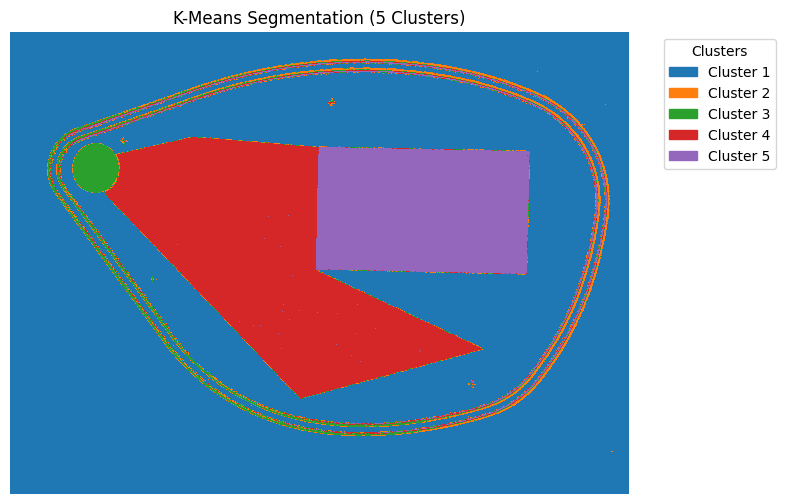

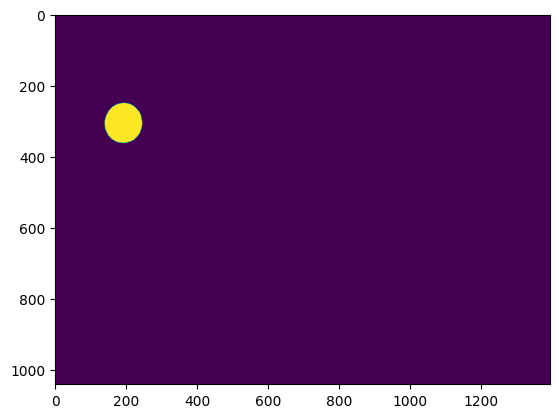

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


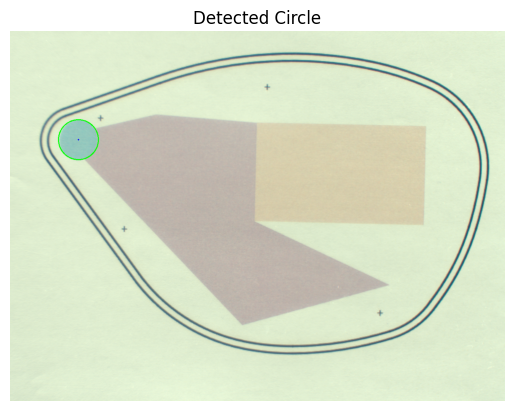

Reflectance shape: (26, 1040, 1392)
RGB shape: (1040, 1392, 3)
Mask shape: (1040, 1392)
Single band shape: (1040, 1392)
Binary shape: (1040, 1392)
circle_info: {'centroid': (192.0535338127406, 305.78660928306823), 'area': 9178.0, 'perimeter': 361.0193330049515, 'min_enclosing_circle': {'center': (192.01333618164062, 305.6365661621094), 'radius': 56.39851379394531}, 'ellipse': ((192.0777587890625, 305.77069091796875), (104.52484893798828, 111.98955535888672), 6.5706610679626465), 'circularity': 0.8849057118483}


In [ ]:
R_sample = (reference_cube - dark_cube) / denominator

band = 530  # Band for alignment

R_sample_interp, new_wavelengths = interpolate_spectral_cube(
    R_sample, wavelengths, wl_min=360, wl_max=830, wl_step=10
)
R_sample_interp = np.transpose(R_sample_interp, (1, 2, 0))  # (H, W, bands)

ref_XYZ = spim2XYZ(R_sample_interp, new_wavelengths, "D65")
ref_LAB = XYZ2Lab(ref_XYZ, new_wavelengths, "D65")
ref_rgb = XYZ2RGB(ref_XYZ)

#ref_rgb = spim2rgb(R_sample, wavelengths)
ref_mask = compute_IC_mask(ref_rgb, pixel_IC = pixel_IC)
ref_single_band = R_sample[wavelengths.index(band), :, :]
ref_binary = convert_binary_image(ref_single_band)
ref_circle_info = get_circle_info(ref_mask, ref_rgb, True)
center_pixel = (
    int(ref_circle_info["centroid"][0]),
    int(ref_circle_info["centroid"][1]),
)
"""if ref_rgb.dtype != np.uint8:
    ref_rgb = np.clip(ref_rgb * 255, 0, 255).astype(np.uint8)"""

circle_center = ref_circle_info["min_enclosing_circle"]["center"]
circle_center = (int(np.round(circle_center[0])), int(np.round(circle_center[1])))
circle_radius = ref_circle_info["min_enclosing_circle"]["radius"]
ref_cropped = crop_circle(ref_rgb, circle_center, circle_radius)
cropped_circles = [ref_cropped]

ref_spectrum = average_reflectance_in_circle(R_sample, circle_center, circle_radius)
spectra = {"reference": ref_spectrum}


mask_ref = np.zeros(ref_LAB.shape[:2], dtype=np.uint8)
cx, cy = int(circle_center[0]), int(circle_center[1])
r = int(circle_radius) - 5
cv2.circle(mask_ref, (cx, cy), r, 1, -1)

ref_cropped = crop_circle(ref_rgb, circle_center, circle_radius)
cropped_circles = [ref_cropped]

print(f"Reflectance shape: {R_sample.shape}")
print(f"RGB shape: {ref_rgb.shape}")
print(f"Mask shape: {ref_mask.shape}")
print(f"Single band shape: {ref_single_band.shape}")
print(f"Binary shape: {ref_binary.shape}")
print(f"circle_info: {ref_circle_info}")

3. Find Homography matrix for the alignment of each defect


Aligning d1...


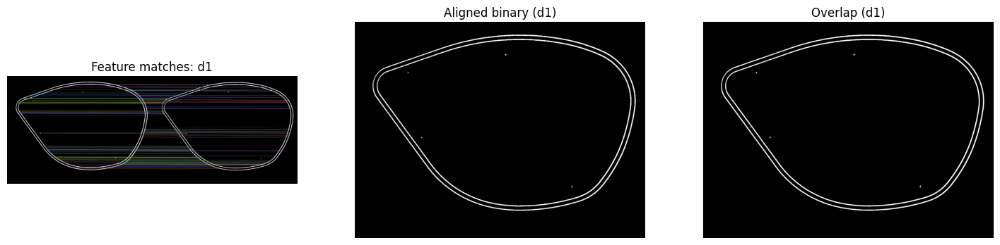

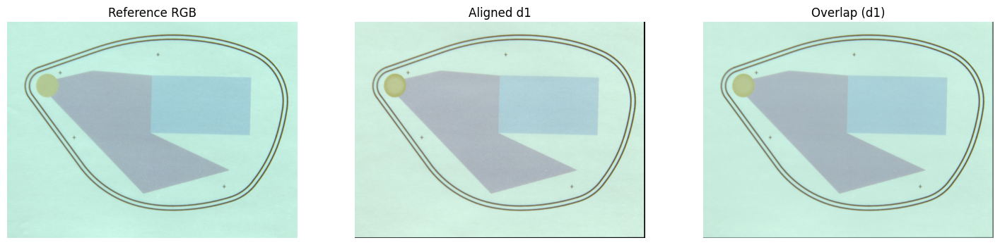

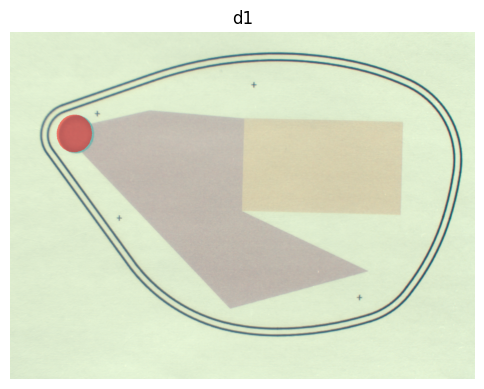

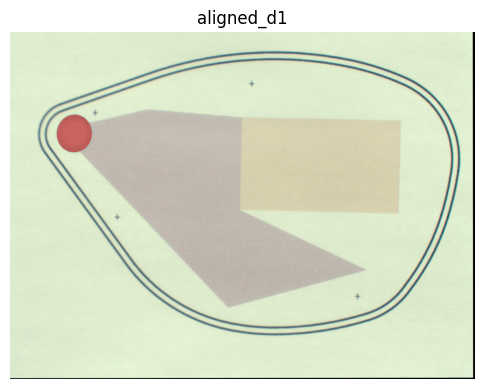

Aligning d2...


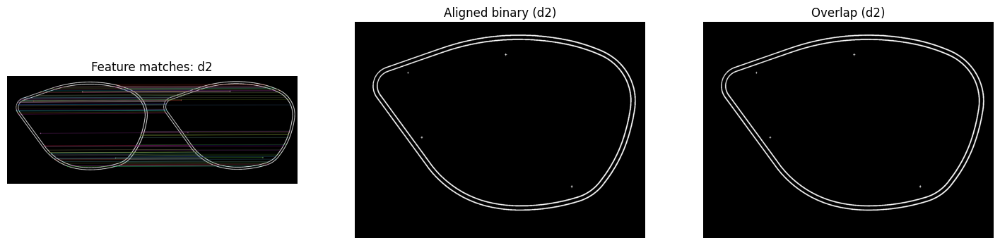

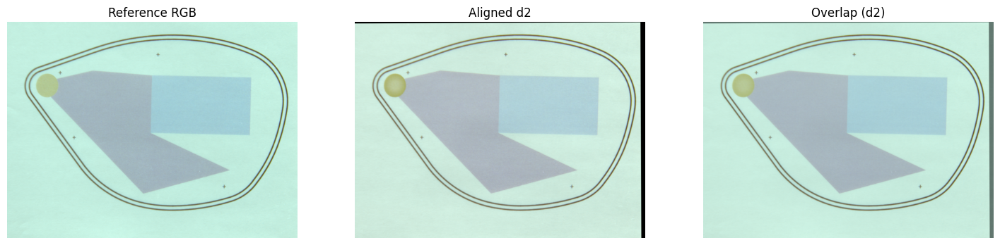

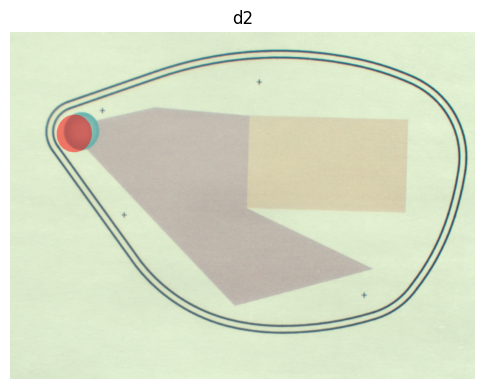

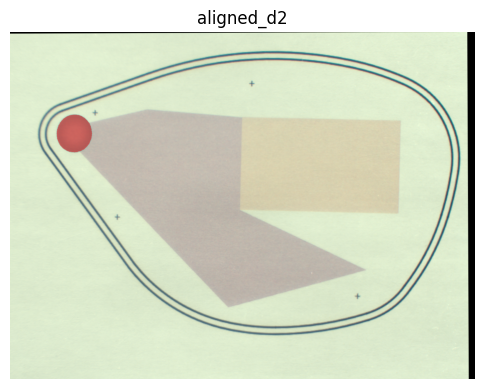

Aligning d3...


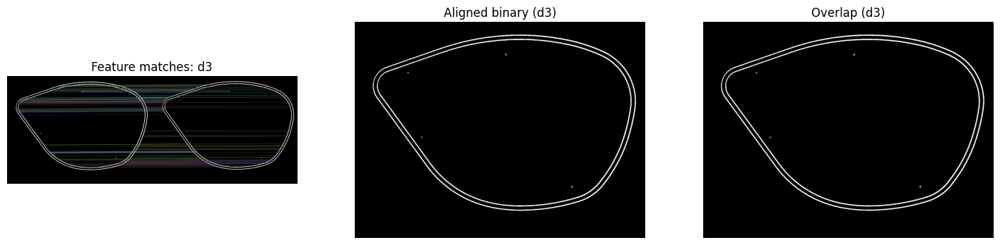

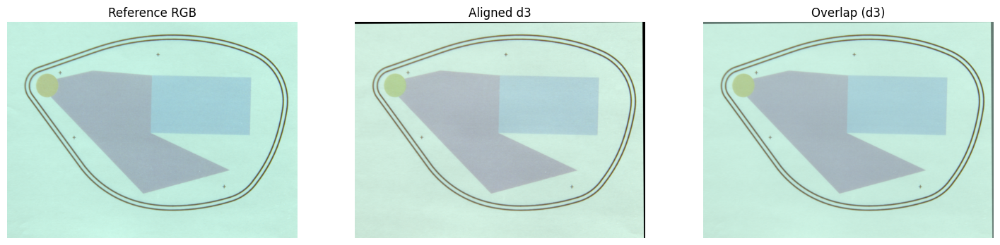

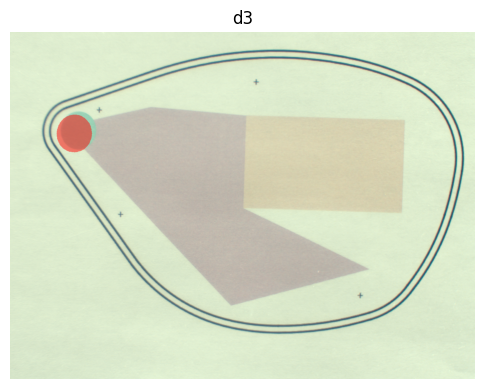

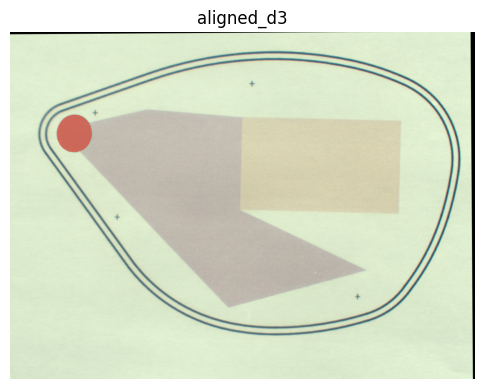

Aligning d4...


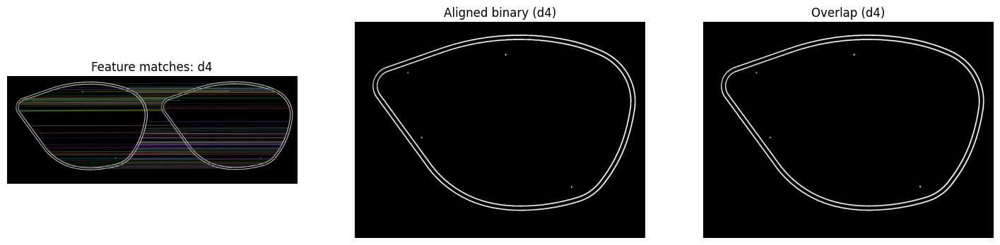

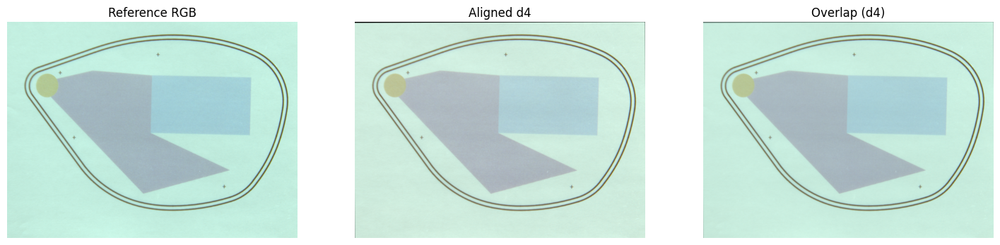

KeyboardInterrupt: 

In [7]:
defect_homographies = []
defects = sample_folders
for defect in defects:
    print(f"Aligning {defect}...")

    defect_rgb = spim2rgb(defect_cubes[defect], wavelengths)
    defect_binary = convert_binary_image(
        get_example_reflectance(defect_cubes, defect, band)
    )
    H = align_and_visualise_homography(
        ref_binary, defect_binary, defect, visualise=True
    )
    defect_homographies.append(H)

    if ref_rgb.dtype != np.uint8:
        ref_rgb = np.clip(ref_rgb * 255, 0, 255).astype(np.uint8)
    if defect_rgb.dtype != np.uint8:
        defect_rgb = np.clip(defect_rgb * 255, 0, 255).astype(np.uint8)

    aligned_defect, blended = align_and_blend_RGB_homography(ref_rgb, defect_rgb, H, defect)
    overlay_mask(defect_rgb, ref_mask, defect, color=(1, 0, 0), alpha=0.5)
    overlay_mask(aligned_defect, ref_mask, f"aligned_{defect}", color=(1, 0, 0), alpha=0.5)

4. CTQs without allignment

In [ ]:
"""def preprocess(img):
    # CLAHE contrast enhancement
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    gray = clahe.apply(img)

    # Smooth edges to reduce noise
    gray = cv2.GaussianBlur(gray, (7,7), 1.5)

    # Optional: sharpen edges
    kernel = np.array([[0,-1,0],
                       [-1,5,-1],
                       [0,-1,0]])
    gray = cv2.filter2D(gray, -1, kernel)

    return gray

def detect_circle_center(image):
    #if image.max() <= 1.0:
    image = (image * 255).astype(np.uint8)

    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Reduce noise
    #gray = cv2.medianBlur(gray, 5)
    gray = preprocess(gray)

    circles = cv2.HoughCircles(
    gray,
    cv2.HOUGH_GRADIENT,
    dp=1.2,
    minDist=80,
    param1=80,   # lower Canny threshold
    param2=20,   # LOWER = more sensitive
    minRadius=20,
    maxRadius=80
    )


    # Draw only the first detected circle
    output = image.copy()
    center = None 
    if circles is not None:
        circles = np.uint16(np.around(circles))
        x, y, r = circles[0][0]
        cv2.circle(output, (x, y), r, (0, 255, 0), 2)  # Circle outline
        cv2.circle(output, (x, y), 2, (0, 0, 255), 3)  # Center point
        # Assign center coordinates
        center = (int(x), int(y))

    # Show result
    plt.imshow(output)
    plt.show()

    return center"""

'def preprocess(img):\n    # CLAHE contrast enhancement\n    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))\n    gray = clahe.apply(img)\n\n    # Smooth edges to reduce noise\n    gray = cv2.GaussianBlur(gray, (7,7), 1.5)\n\n    # Optional: sharpen edges\n    kernel = np.array([[0,-1,0],\n                       [-1,5,-1],\n                       [0,-1,0]])\n    gray = cv2.filter2D(gray, -1, kernel)\n\n    return gray\n\ndef detect_circle_center(image):\n    #if image.max() <= 1.0:\n    image = (image * 255).astype(np.uint8)\n\n    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)\n\n    # Reduce noise\n    #gray = cv2.medianBlur(gray, 5)\n    gray = preprocess(gray)\n\n    circles = cv2.HoughCircles(\n    gray,\n    cv2.HOUGH_GRADIENT,\n    dp=1.2,\n    minDist=80,\n    param1=80,   # lower Canny threshold\n    param2=20,   # LOWER = more sensitive\n    minRadius=20,\n    maxRadius=80\n    )\n\n\n    # Draw only the first detected circle\n    output = image.copy()\n    center 

In [ ]:
"""defects_radius = []
deltaE_results = []
for i, defect_name in enumerate(defects):
    print(f"Processing {defect_name}...")

    # CTQ2 (in RGB)
    # Align defect
    defect_rgb = spim2rgb(defect_cubes[defect_name], wavelengths)
    defect_rgb = R_sample[wavelengths.index(band), :, :]
    defect_rgb = extract_RGB(defect_cubes[defect_name], wavelengths)
    h, w, b = defect_rgb.shape
    defect_rgb = defect_rgb[:round(h/2), :round(w/2),:]
    #plt.imshow(defect_rgb)
    #plt.show()
    center = detect_circle_center(defect_rgb)
    print(center)
    # Compute defect mask of IC to find circle radius
    defect_mask = compute_IC_mask(defect_rgb, None, True, center)
    defect_circle_info = get_circle_info(defect_mask, defect_rgb, True)
    circle_radius = defect_circle_info["min_enclosing_circle"]["radius"]
    defects_radius.append(circle_radius)

    new_center =  np.round(defect_circle_info["centroid"])

    cropped_circle = crop_circle(defect_rgb, new_center, circle_radius)
    cropped_circles.append(cropped_circle)

    # mask:
    mask = np.zeros(defect_rgb.shape[:2], dtype=np.uint8)
    cx, cy = int(new_center[0]), int(new_center[1])
    r = int(circle_radius) - 5
    cv2.circle(mask_ref, (cx, cy), r, 1, -1)

    # todo
    # CTQ1 (all spectra)
    # Compute spectral average
    cube = defect_cubes[defect_name]
    bands, h, w = cube.shape

    # Align full cube
    cube_aligned = cube[:,:round(h/2), :round(w/2)]
    ref_LAB = ref_LAB[:round(h/2), :round(w/2),:]
    #cube_aligned = np.stack(
     #   [cv2.warpAffine(cube[j], A_3x3[:2, :], (w, h)) for j in range(bands)])

    # Spectral to XYZ to LAB
    cube_interp, _ = interpolate_spectral_cube(
        cube_aligned, wavelengths, wl_min=360, wl_max=830, wl_step=10
    )
    cube_interp = np.transpose(cube_interp, (1, 2, 0))  # (H, W, b)

    def_XYZ = spim2XYZ(cube_interp, new_wavelengths, "D65")
    def_LAB = XYZ2Lab(def_XYZ, new_wavelengths, "D65")

    # CIelab delta E with reference
    # plt.imshow(def_LAB)
    # plt.show()
    # plt.imshow(ref_LAB)
    # plt.show()
    DE_mean = calculate_delta_E(ref_LAB, def_LAB, mask=mask)
    deltaE_results.append(DE_mean)"""

'defects_radius = []\ndeltaE_results = []\nfor i, defect_name in enumerate(defects):\n    print(f"Processing {defect_name}...")\n\n    # CTQ2 (in RGB)\n    # Align defect\n    defect_rgb = spim2rgb(defect_cubes[defect_name], wavelengths)\n    defect_rgb = R_sample[wavelengths.index(band), :, :]\n    defect_rgb = extract_RGB(defect_cubes[defect_name], wavelengths)\n    h, w, b = defect_rgb.shape\n    defect_rgb = defect_rgb[:round(h/2), :round(w/2),:]\n    #plt.imshow(defect_rgb)\n    #plt.show()\n    center = detect_circle_center(defect_rgb)\n    print(center)\n    # Compute defect mask of IC to find circle radius\n    defect_mask = compute_IC_mask(defect_rgb, None, True, center)\n    defect_circle_info = get_circle_info(defect_mask, defect_rgb, True)\n    circle_radius = defect_circle_info["min_enclosing_circle"]["radius"]\n    defects_radius.append(circle_radius)\n\n    new_center =  np.round(defect_circle_info["centroid"])\n\n    cropped_circle = crop_circle(defect_rgb, new_center, 

5. Compute CTQs for all defects


Processing d1...
[[ 9.99896621e-01  1.08102483e-03 -6.58401040e+00]
 [-1.08102483e-03  9.99896621e-01 -2.25799711e+00]]


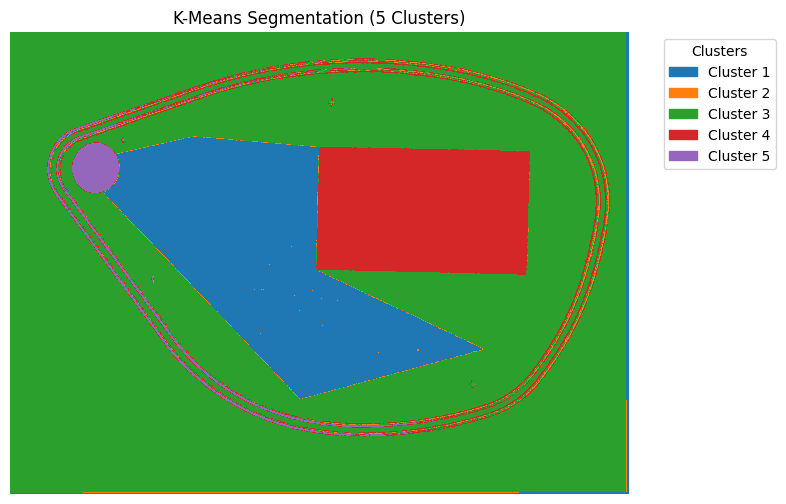

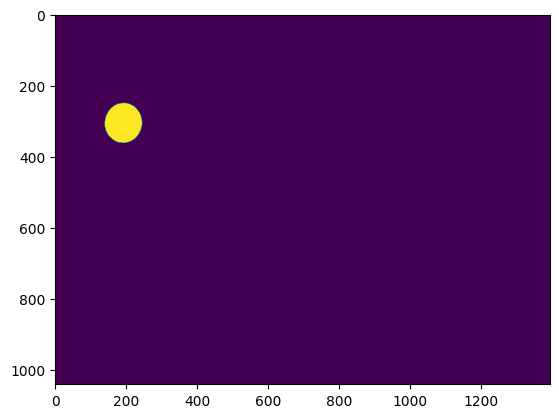

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


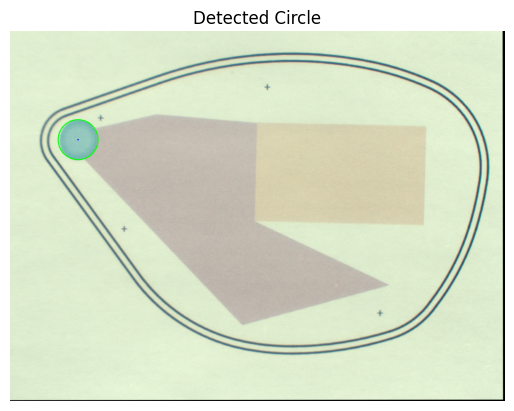

Processing d2...
[[ 9.99791227e-01  4.25897707e-03 -2.27817198e+01]
 [-4.25897707e-03  9.99791227e-01  7.92670496e+00]]


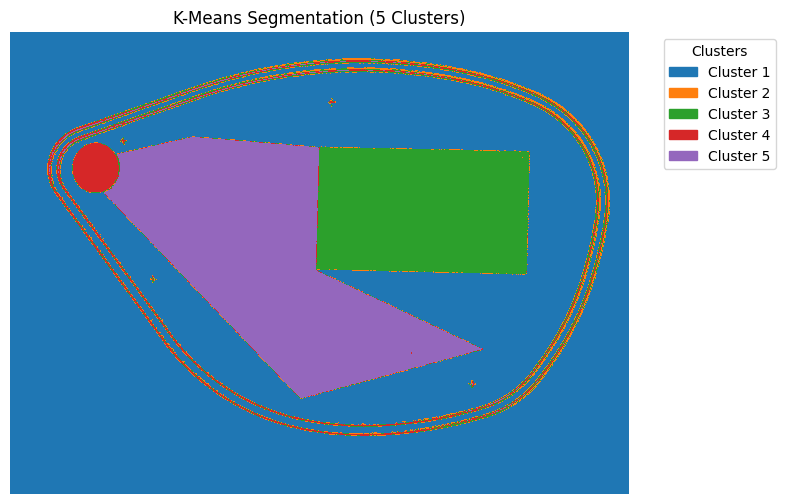

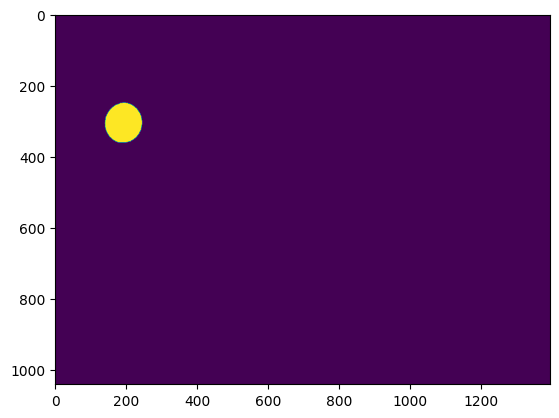

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


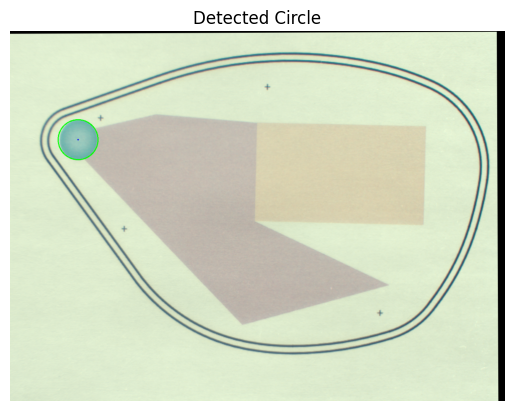

Processing d3...
[[ 1.00050724e+00  6.74584446e-03 -1.39294610e+01]
 [-6.74584446e-03  1.00050724e+00  9.93816159e+00]]


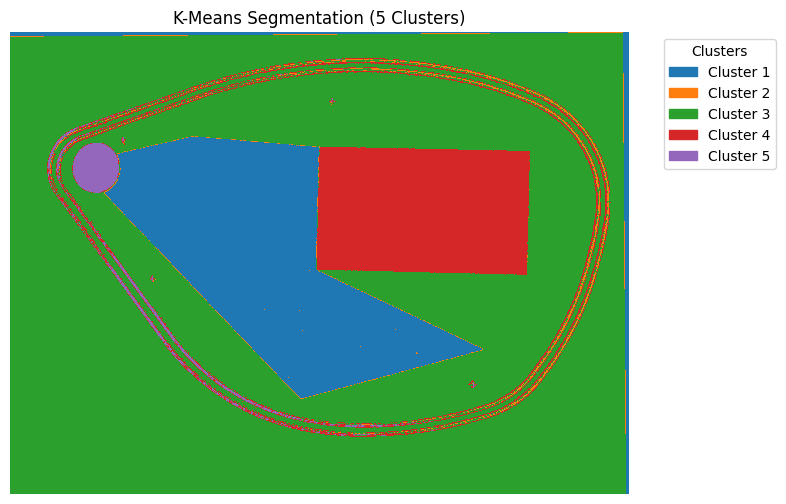

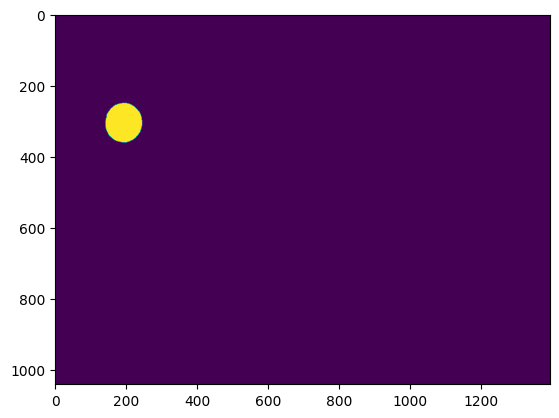

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


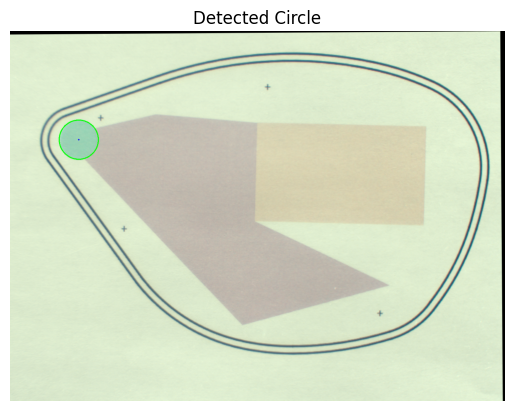

Processing d4...
[[ 1.00099886e+00  3.00448447e-03 -2.38680625e+00]
 [-3.00448447e-03  1.00099886e+00  5.07056031e+00]]


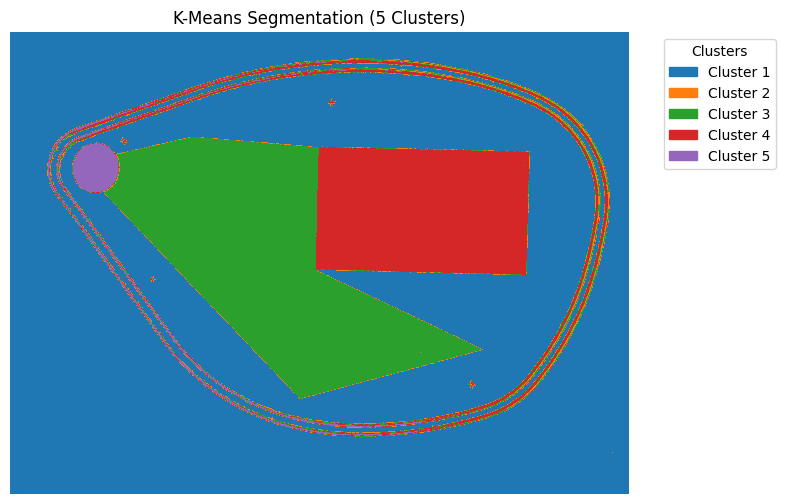

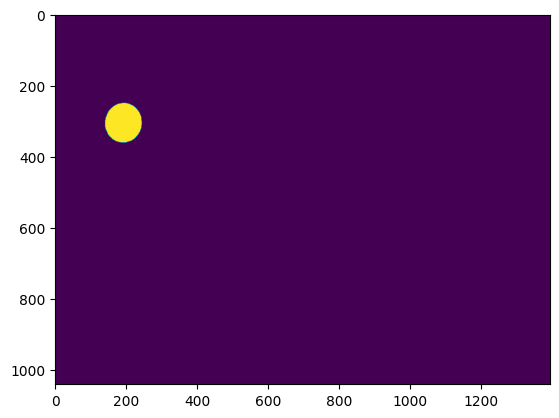

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


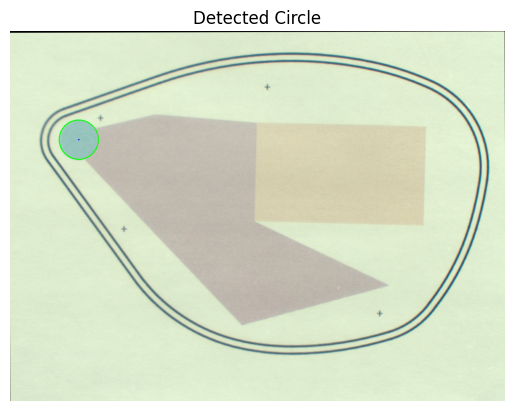

Processing d5...
[[ 1.00008601e+00 -1.08796924e-03  2.62636823e+01]
 [ 1.08796924e-03  1.00008601e+00 -3.62418569e-01]]


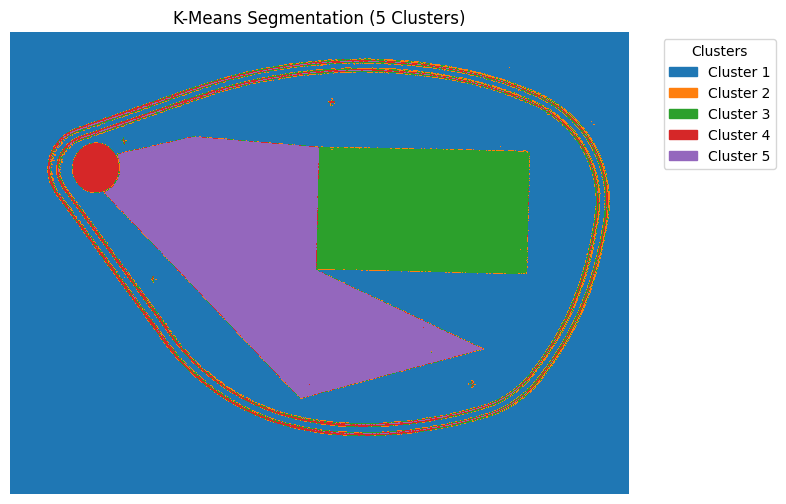

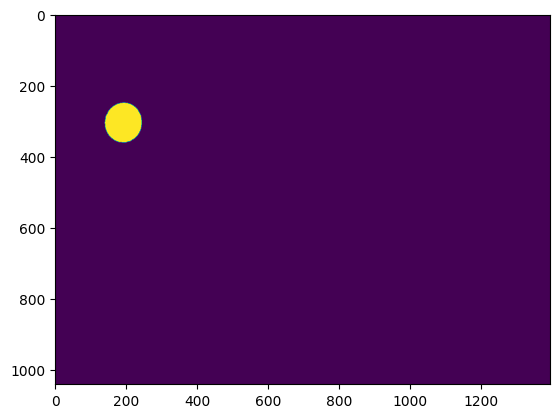

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


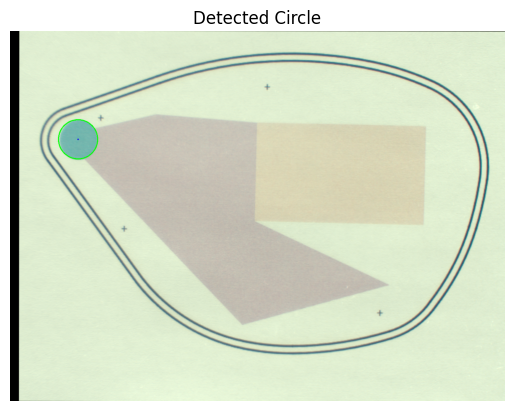

Processing d6...
[[ 1.00128674e+00  5.09890867e-03  4.85998467e+01]
 [-5.09890867e-03  1.00128674e+00  7.87067414e+00]]


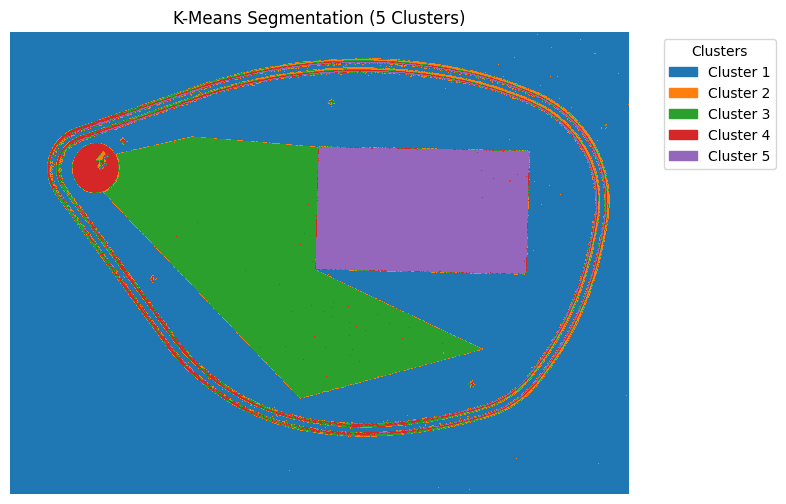

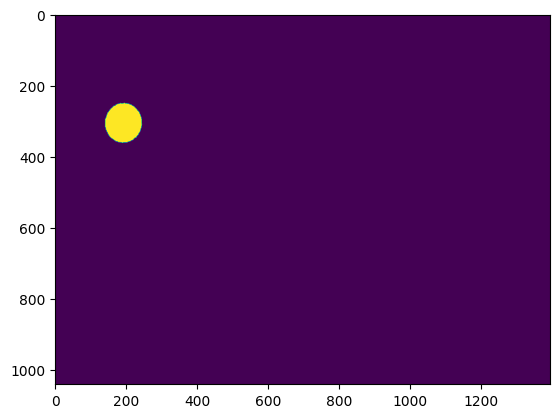

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


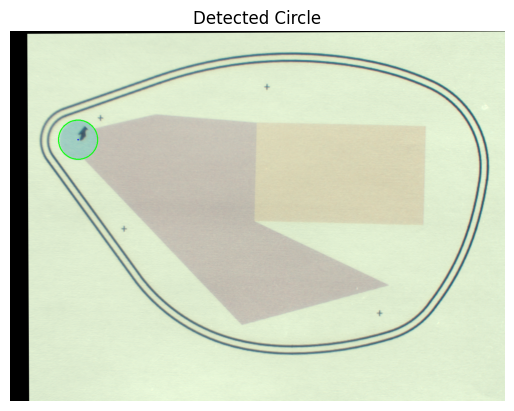

Processing d7...
[[ 1.00069490e+00  5.71815459e-04  4.59045076e+00]
 [-5.71815459e-04  1.00069490e+00  6.10102561e+00]]


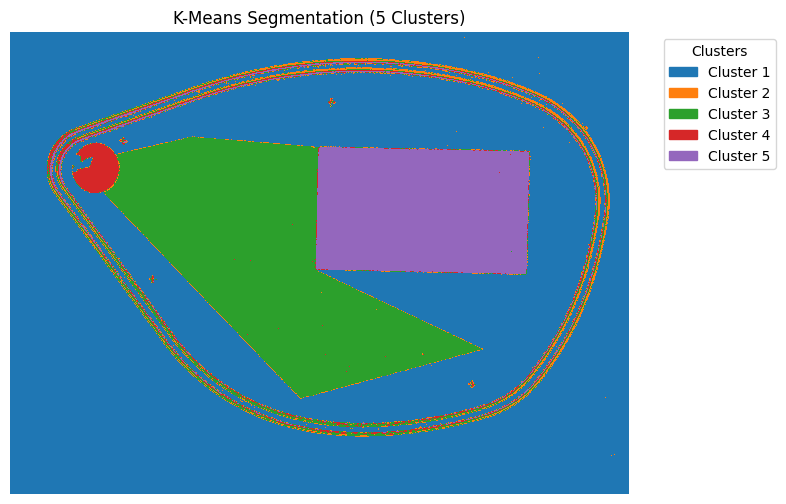

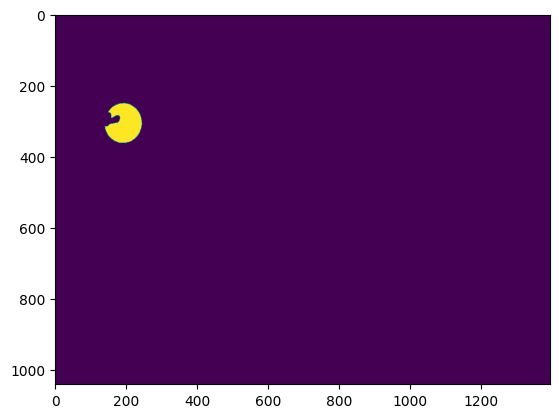

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


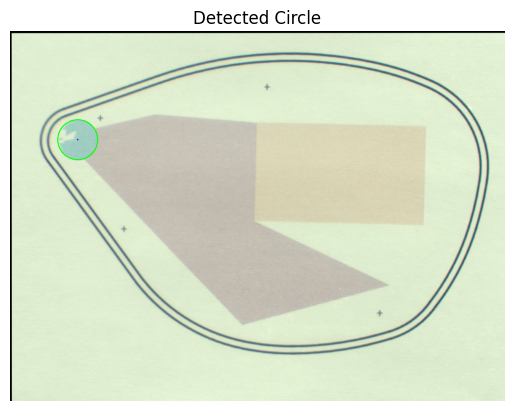

Processing d8...
[[ 1.00089698e+00  7.78382115e-04 -8.97324030e-01]
 [-7.78382115e-04  1.00089698e+00  6.09202650e+00]]


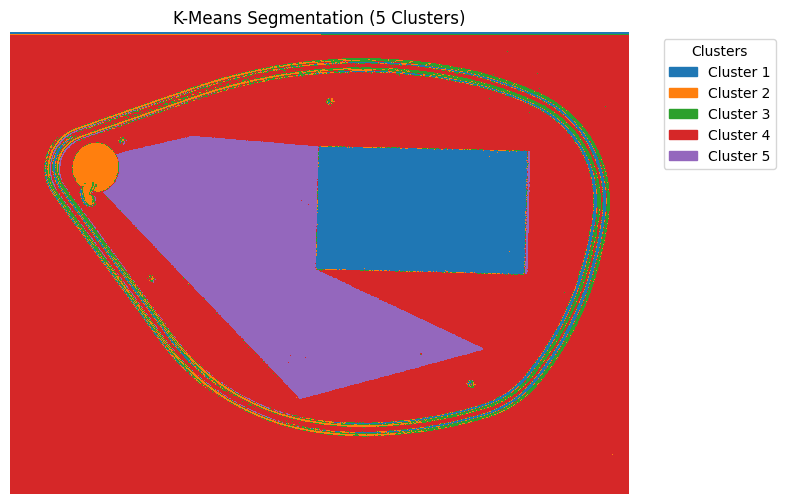

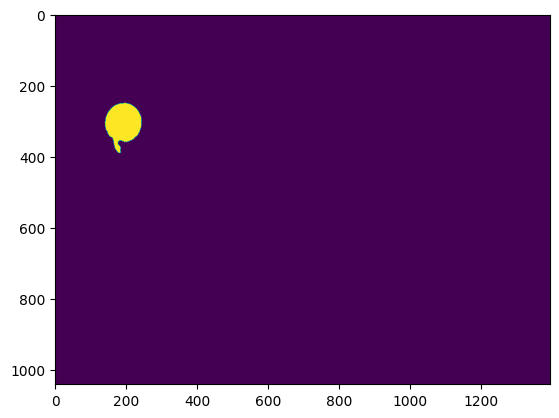

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


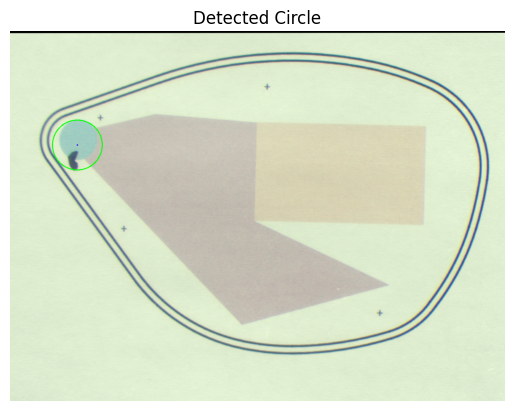

Processing d9...
[[ 9.99410840e-01  3.61598398e-03 -2.36647584e+01]
 [-3.61598398e-03  9.99410840e-01  1.07929605e+01]]


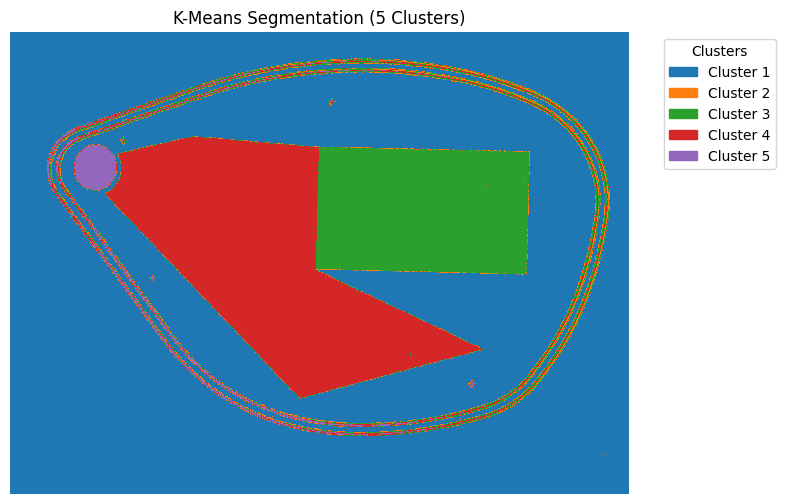

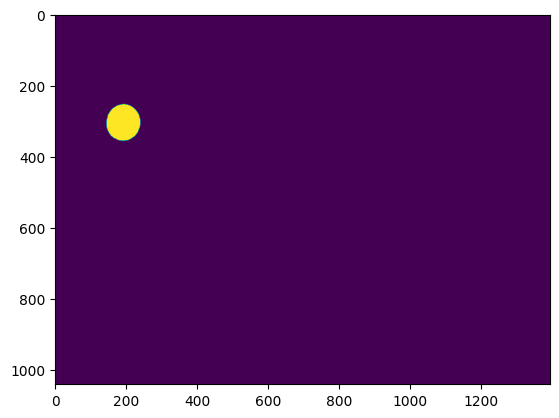

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


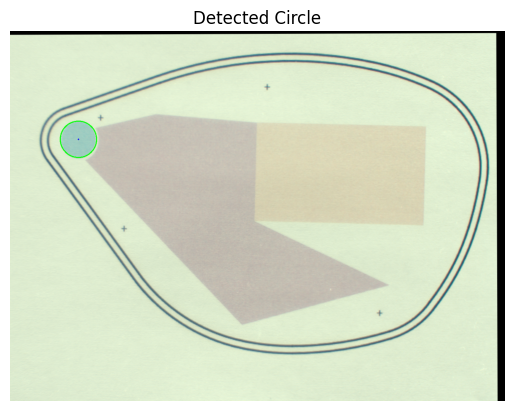

Processing d10...
[[ 9.99807090e-01  5.78741940e-03 -1.75886064e+01]
 [-5.78741940e-03  9.99807090e-01  9.92499338e+00]]


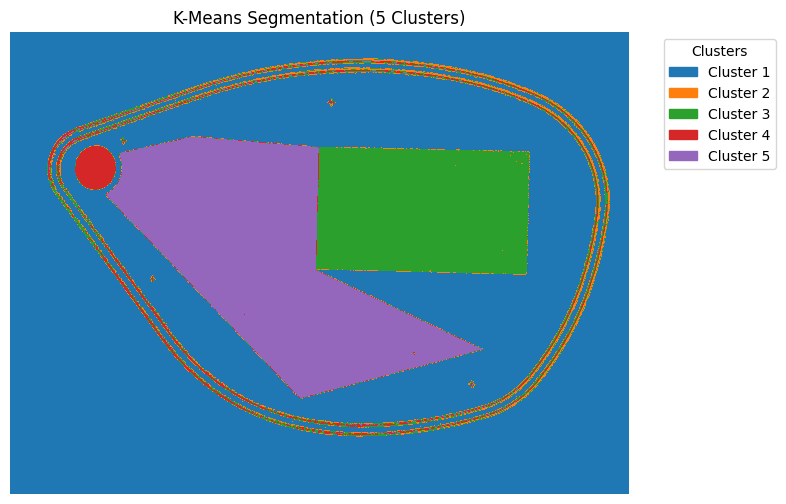

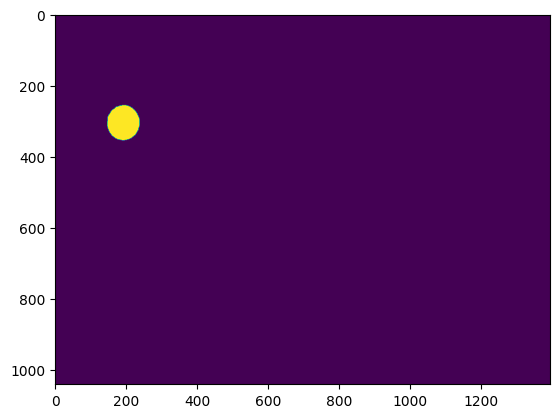

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


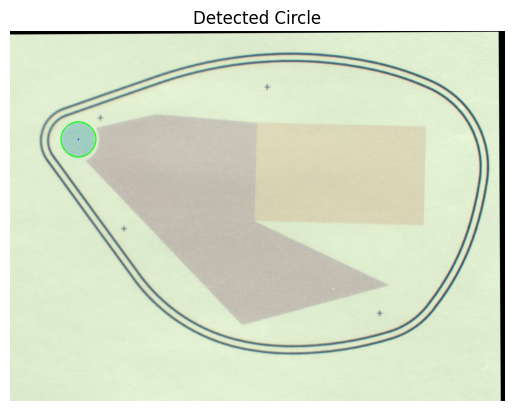

Processing d11...
[[ 1.00143529e+00  2.53315774e-03  3.31575167e+01]
 [-2.53315774e-03  1.00143529e+00  6.53079023e+00]]


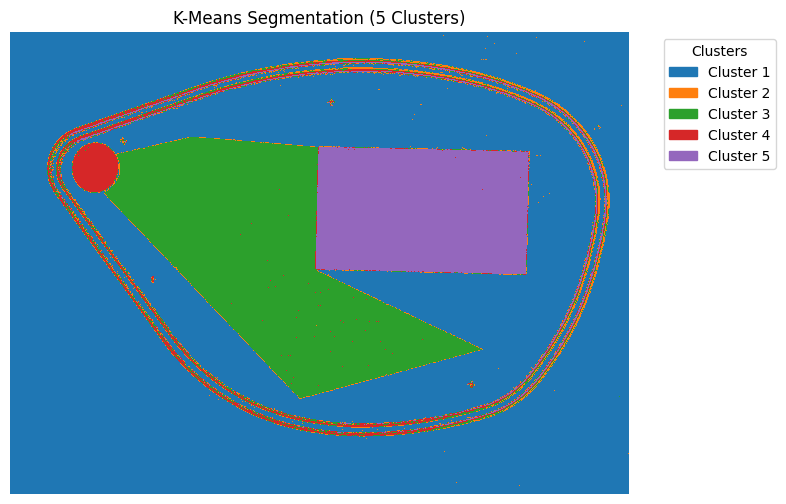

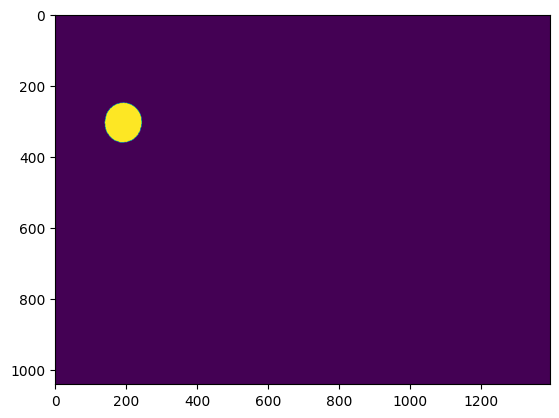

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


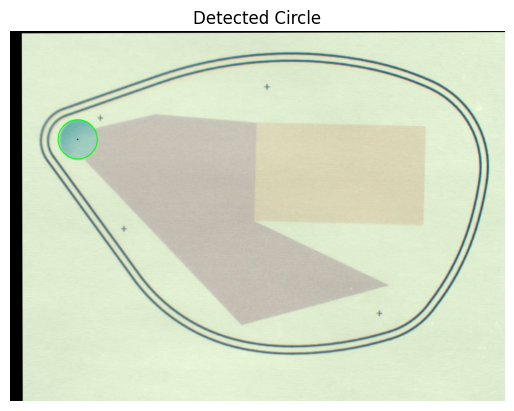

Processing d12...
[[ 1.00138144e+00  1.71800932e-03  1.55861504e+01]
 [-1.71800932e-03  1.00138144e+00  6.52348089e+00]]


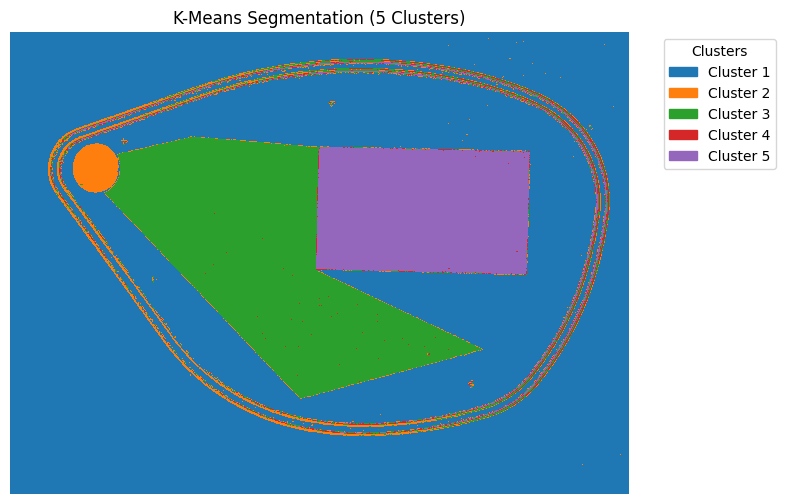

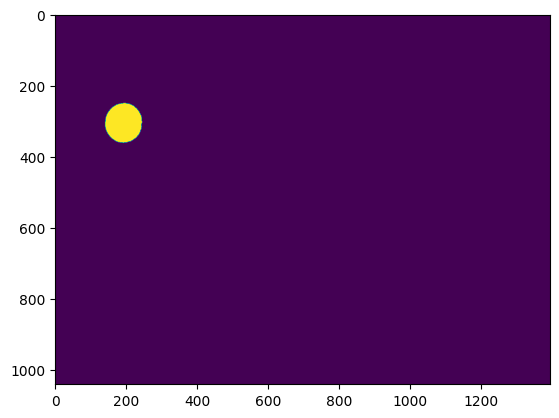

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


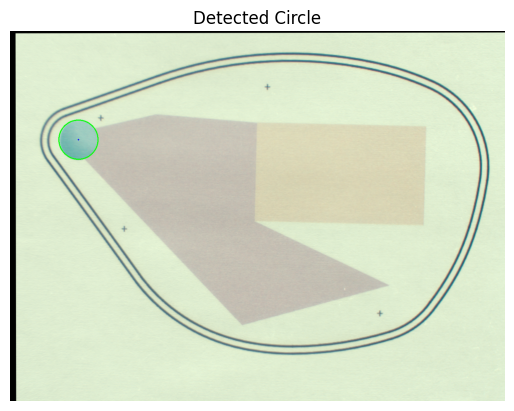

Processing d13...
[[ 1.00016068e+00  3.96910489e-03 -1.38685922e+01]
 [-3.96910489e-03  1.00016068e+00  6.99399821e+00]]


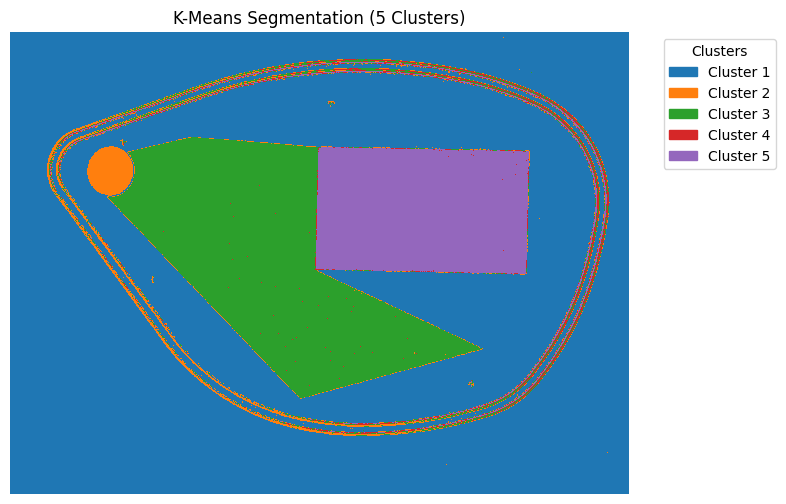

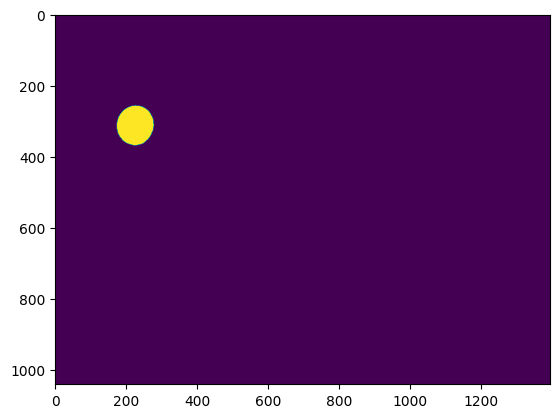

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


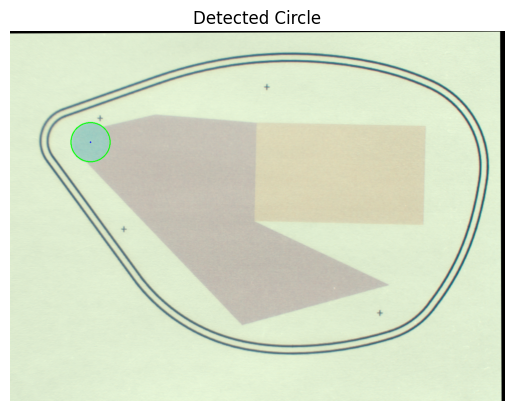

Processing d14...
[[ 1.00029144e+00  3.16649562e-04 -4.09571325e-01]
 [-3.16649562e-04  1.00029144e+00  7.26082956e+00]]


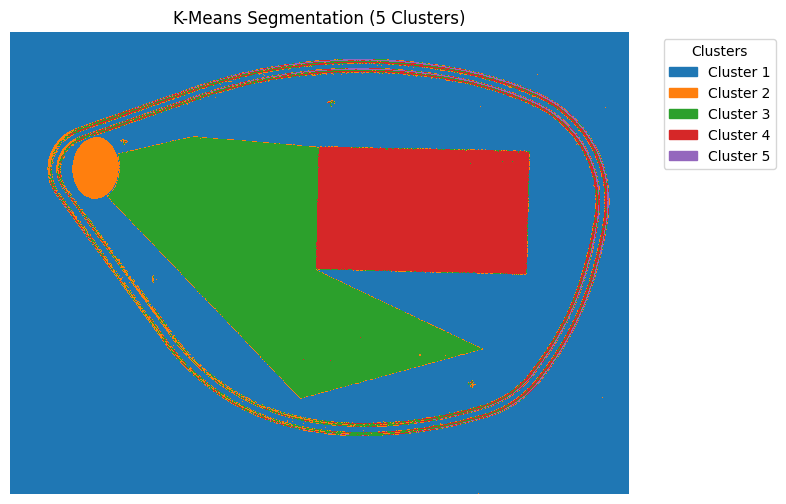

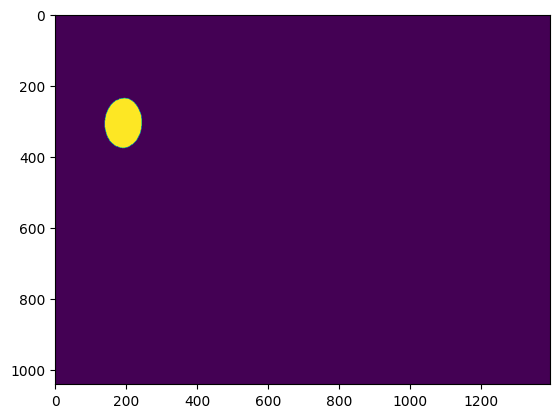

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


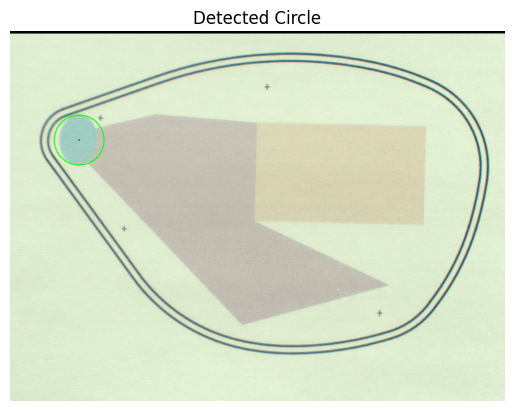

In [ ]:
deltaE_results = []
defects_radius = []
defects_aligned = []

for i, defect_name in enumerate(defects):
    print(f"Processing {defect_name}...")

    # CTQ2 (in RGB)
    # Align defect
    A_3x3 = defect_homographies[i]
    print(A_3x3)
    A_2x3 = A_3x3[:2, :]
    defect_rgb = spim2rgb(defect_cubes[defect_name], wavelengths)
    h, w, b = defect_rgb.shape
    aligned_defect = cv2.warpAffine(defect_rgb, A_2x3, (w, h))
    defects_aligned.append(aligned_defect)

    # Compute defect mask of IC to find circle radius
    defect_mask = compute_IC_mask(defect_rgb, A_2x3, True, circle_center)
    defect_circle_info = get_circle_info(defect_mask, aligned_defect, True)
    defects_radius.append(defect_circle_info["min_enclosing_circle"]["radius"])

    # Masked CTQ for visualization
    cropped_circle = crop_circle(aligned_defect, circle_center, circle_radius)
    cropped_circles.append(cropped_circle)

    # CTQ1 (all spectra)
    # Compute spectral average
    cube = defect_cubes[defect_name]
    bands, h, w = cube.shape

    # Align full cube
    cube_aligned = np.stack(
        [cv2.warpAffine(cube[j], A_3x3[:2, :], (w, h)) for j in range(bands)]
    )

    # Spectral to XYZ to LAB
    cube_interp, _ = interpolate_spectral_cube(
        cube_aligned, wavelengths, wl_min=360, wl_max=830, wl_step=10
    )
    cube_interp = np.transpose(cube_interp, (1, 2, 0))  # (H, W, b)

    def_XYZ = spim2XYZ(cube_interp, new_wavelengths, "D65")
    def_LAB = XYZ2Lab(def_XYZ, new_wavelengths, "D65")

    # CIelab delta E with reference
    DE_mean = calculate_delta_E(ref_LAB, def_LAB, mask=mask_ref)
    deltaE_results.append(DE_mean)

In [ ]:
defects_radius

[56.1472282409668,
 56.51558303833008,
 55.47915267944336,
 55.73166275024414,
 55.915802001953125,
 55.77436065673828,
 56.078155517578125,
 70.78321838378906,
 51.381370544433594,
 49.38909912109375,
 55.84718704223633,
 55.701595306396484,
 55.7401008605957,
 70.11428833007812]

7. Create df to save results


In [ ]:
# Save results to df
result_df = pd.DataFrame()
result_df["defect_id"] = defects
result_df["DE_mean"] = deltaE_results
result_df["radius"] = defects_radius
result_df["CTQ1"] = np.array(deltaE_results) > 2.8
result_df["CTQ2"] = abs(np.array(defects_radius) - circle_radius) > 1.2 # new reference  50 
result_df["Defect?"] = result_df["CTQ1"] | result_df["CTQ2"]
result_df.to_csv(f"deltaE_results_test{trial}_operator{operator}.csv", index=False)
print("\nAverage DE (CIE2000) values per defect:")
print(result_df)


Average DE (CIE2000) values per defect:
   defect_id   DE_mean     radius   CTQ1   CTQ2  Defect?
0         d1  2.639210  56.147228  False  False    False
1         d2  4.265695  56.515583   True  False     True
2         d3  7.990859  55.479153   True  False     True
3         d4  2.383328  55.731663  False  False    False
4         d5  6.374066  55.915802   True  False     True
5         d6  4.278260  55.774361   True  False     True
6         d7  4.012979  56.078156   True  False     True
7         d8  3.664566  70.783218   True   True     True
8         d9  2.780860  51.381371  False   True     True
9        d10  3.838194  49.389099   True   True     True
10       d11  3.339193  55.847187   True  False     True
11       d12  3.476159  55.701595   True  False     True
12       d13  7.571178  55.740101   True  False     True
13       d14  2.561903  70.114288  False   True     True


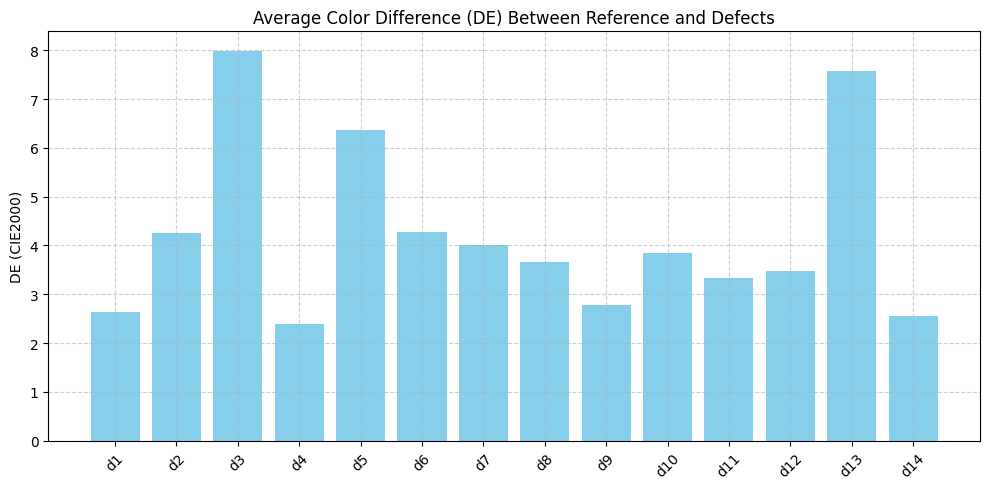

In [ ]:
# Plot delta E differences
plt.figure(figsize=(10, 5))
plt.bar(result_df["defect_id"], result_df["DE_mean"], color="skyblue")
plt.ylabel("DE (CIE2000)")
plt.title("Average Color Difference (DE) Between Reference and Defects")
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

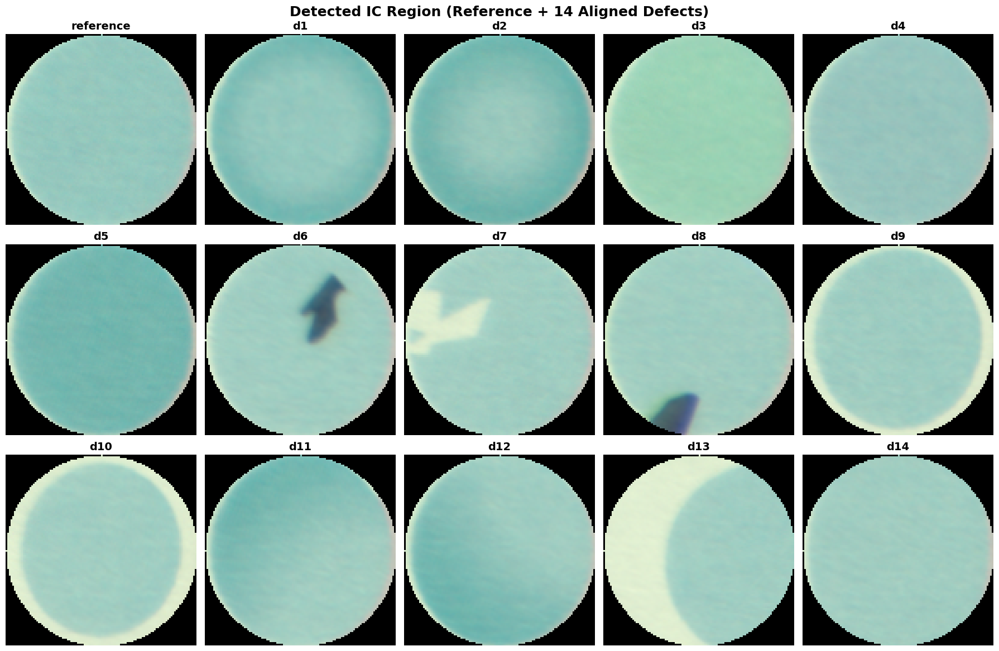

In [ ]:
# Plot masked IC region
titles = ["reference"] + defects
plt.figure(figsize=(18, 12))
cols = 5
rows = math.ceil((len(defects) + 1) / cols)
for idx, (img, title) in enumerate(zip(cropped_circles, titles)):
    plt.subplot(rows, cols, idx + 1)
    if img.ndim == 2:
        plt.imshow(img, cmap="gray")
    else:
        plt.imshow(img)
    plt.title(title, fontsize=14, fontweight="bold")
    plt.axis("off")

plt.suptitle(
    "Detected IC Region (Reference + 14 Aligned Defects)",
    fontsize=18,
    fontweight="bold",
)
plt.tight_layout()
plt.show()

6. Average reflectance in Circle


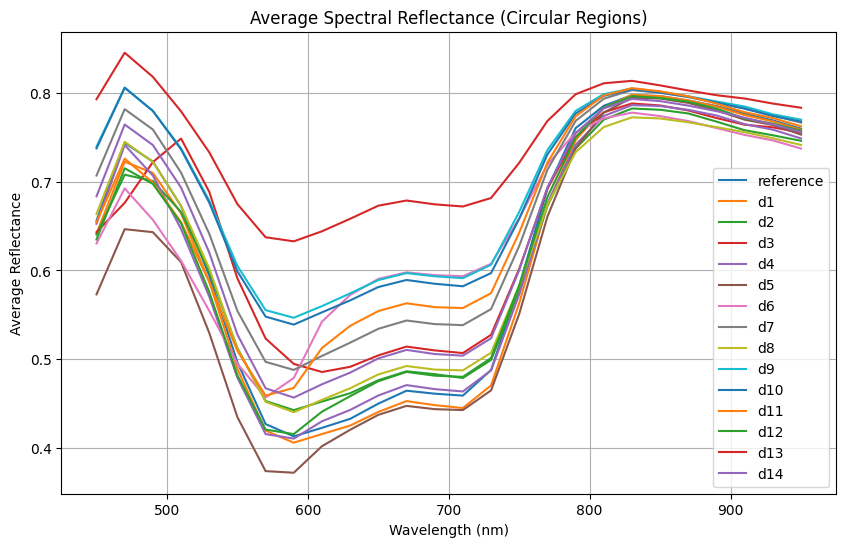

In [ ]:
# Plot average spectra of each defect
for defect_name in defects:
    cube = defect_cubes[defect_name]
    spec = average_reflectance_in_circle(
        cube, circle_center, circle_radius, transform=A_3x3
    )
    spectra[defect_name] = spec
plt.figure(figsize=(10, 6))
for name, spectrum in spectra.items():
    # if name == "reference" or name == "d4":
    #     plt.plot(wavelengths, spectrum, label=name)
    plt.plot(wavelengths, spectrum, label=name)

plt.xlabel("Wavelength (nm)")
plt.ylabel("Average Reflectance")
plt.title("Average Spectral Reflectance (Circular Regions)")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
def std_reflectance_in_circle(hypercube, center, radius, transform=None):
    bands, h, w = hypercube.shape

    hypercube_aligned = np.stack(
        [cv2.warpAffine(hypercube[i], transform, (w, h)) for i in range(bands)]
    )

    mask = np.zeros((h, w), dtype=np.uint8)
    cx, cy = int(round(center[0])), int(round(center[1]))
    r = int(radius) - 5
    cv2.circle(mask, (cx, cy), r, 1, -1)

    std_reflectance = []
    for i in range(bands):
        band = hypercube_aligned[i]
        masked_pixels = band[mask == 1]
        if masked_pixels.size > 0:
            std_reflectance.append(np.std(masked_pixels))
        else:
            std_reflectance.append(np.nan)

    return np.array(std_reflectance)


new_spectra = {}
new_spectra_std = {}

for defect_name, transform in zip(defects, defect_homographies):
    cube = defect_cubes[defect_name]
    new_spectra[defect_name] = average_reflectance_in_circle(
        cube, circle_center, circle_radius, transform=transform
    )
    new_spectra_std[defect_name] = std_reflectance_in_circle(
        cube, circle_center, circle_radius, transform=transform
    )


for defect_name in defects:
    std_values = new_spectra_std[defect_name]
    mean_values = new_spectra[defect_name]

    print(
        f"{defect_name}: Mean Std across wavelengths = {np.nanmean(std_values):.6f}, Coefficient of Variation (mean) = {np.nanmean(std_values/mean_values)*100:.2f}%"
    )

d1: Mean Std across wavelengths = 0.030163, Coefficient of Variation (mean) = 6.07%
d2: Mean Std across wavelengths = 0.035590, Coefficient of Variation (mean) = 7.80%
d3: Mean Std across wavelengths = 0.014262, Coefficient of Variation (mean) = 2.35%
d4: Mean Std across wavelengths = 0.012208, Coefficient of Variation (mean) = 2.11%
d5: Mean Std across wavelengths = 0.014080, Coefficient of Variation (mean) = 2.96%
d6: Mean Std across wavelengths = 0.106323, Coefficient of Variation (mean) = 17.73%
d7: Mean Std across wavelengths = 0.051992, Coefficient of Variation (mean) = 8.93%
d8: Mean Std across wavelengths = 0.087333, Coefficient of Variation (mean) = 14.24%
d9: Mean Std across wavelengths = 0.028319, Coefficient of Variation (mean) = 4.98%
d10: Mean Std across wavelengths = 0.042393, Coefficient of Variation (mean) = 7.31%
d11: Mean Std across wavelengths = 0.043890, Coefficient of Variation (mean) = 8.72%
d12: Mean Std across wavelengths = 0.043058, Coefficient of Variation (m

In [ ]:
avg_std_per_defect = {
    name: np.nanmean(std_values) for name, std_values in new_spectra_std.items()
}

sorted_defects = sorted(avg_std_per_defect.items(), key=lambda x: x[1], reverse=True)
for rank, (name, std_val) in enumerate(sorted_defects, 1):
    print(f"{name}: {std_val:.6f}")

d6: 0.106323
d8: 0.087333
d13: 0.084687
d7: 0.051992
d11: 0.043890
d12: 0.043058
d10: 0.042393
d2: 0.035590
d1: 0.030163
d9: 0.028319
d3: 0.014262
d5: 0.014080
d14: 0.012370
d4: 0.012208
